In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

In [2]:
df_features = pd.read_csv('dengue_features_train.csv')
df_labels = pd.read_csv('dengue_labels_train.csv')

In [3]:
df_features.value_counts(subset=['city'])

city
sj      936
iq      520
dtype: int64

In [4]:
df_features

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,iq,2010,21,2010-05-28,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,...,45.00,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0
1452,iq,2010,22,2010-06-04,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,...,207.10,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6
1453,iq,2010,23,2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,...,50.60,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4
1454,iq,2010,24,2010-06-18,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,...,62.33,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0


In [5]:
df_features_sj = df_features[df_features.city == 'sj'].drop('city', axis = 1)
df_features_iq = df_features[df_features.city == 'iq'].drop('city', axis = 1)

df_labels_sj = df_labels[df_labels.city == 'sj'].drop('city', axis = 1)['total_cases']
df_labels_iq = df_labels[df_labels.city == 'iq'].drop('city', axis = 1)['total_cases']

In [6]:
df_features_iq

,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
936,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,298.450000,...,43.19,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0
937,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,298.428571,...,46.00,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6
938,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,297.392857,...,64.77,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1
939,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,296.228571,...,23.96,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0
940,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,297.635714,...,31.80,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,2010,21,2010-05-28,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,...,45.00,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0
1452,2010,22,2010-06-04,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,...,207.10,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6
1453,2010,23,2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,...,50.60,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4
1454,2010,24,2010-06-18,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,297.521429,...,62.33,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0


In [7]:
print('shape of San Juan: ', df_features_sj.shape)
print(df_features_sj.count())
print('shape of Puerto Rico: ', df_features_iq.shape)
print(df_features_iq.count())

shape of San Juan:  (936, 23)
year                                     936
weekofyear                               936
week_start_date                          936
ndvi_ne                                  745
ndvi_nw                                  887
ndvi_se                                  917
ndvi_sw                                  917
precipitation_amt_mm                     927
reanalysis_air_temp_k                    930
reanalysis_avg_temp_k                    930
reanalysis_dew_point_temp_k              930
reanalysis_max_air_temp_k                930
reanalysis_min_air_temp_k                930
reanalysis_precip_amt_kg_per_m2          930
reanalysis_relative_humidity_percent     930
reanalysis_sat_precip_amt_mm             927
reanalysis_specific_humidity_g_per_kg    930
reanalysis_tdtr_k                        930
station_avg_temp_c                       930
station_diur_temp_rng_c                  930
station_max_temp_c                       930
station_min_temp_c       

In [8]:
df_features_sj.describe()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
count,936.000000,936.000000,745.000000,887.000000,917.000000,917.000000,927.000000,930.000000,930.000000,930.000000,...,930.000000,930.000000,927.000000,930.000000,930.000000,930.000000,930.000000,930.000000,930.000000,930.000000
mean,1998.826923,26.503205,0.057925,0.067469,0.177655,0.165956,35.470809,299.163653,299.276920,295.109519,...,30.465419,78.568181,35.470809,16.552409,2.516267,27.006528,6.757373,31.607957,22.600645,26.785484
std,5.212076,15.021909,0.107153,0.092479,0.057166,0.056073,44.606137,1.236429,1.218637,1.569943,...,35.628055,3.389488,44.606137,1.560923,0.498892,1.415473,0.835993,1.717297,1.506277,29.325811
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,295.938571,296.114286,289.642857,...,0.000000,66.735714,0.000000,11.715714,1.357143,22.842857,4.528571,26.700000,17.800000,0.000000
25%,1994.000000,13.750000,0.004500,0.016425,0.139283,0.129157,0.000000,298.195000,298.300000,293.847857,...,10.825000,76.246071,0.000000,15.236429,2.157143,25.842857,6.200000,30.600000,21.700000,6.825000
50%,1999.000000,26.500000,0.057700,0.068075,0.177186,0.165971,20.800000,299.254286,299.378571,295.464286,...,21.300000,78.667857,20.800000,16.845714,2.457143,27.228571,6.757143,31.700000,22.800000,17.750000
75%,2003.000000,39.250000,0.111100,0.115200,0.212557,0.202771,52.180000,300.132857,300.228571,296.418929,...,37.000000,80.963214,52.180000,17.858571,2.800000,28.185714,7.285714,32.800000,23.900000,35.450000
max,2008.000000,53.000000,0.493400,0.437100,0.393129,0.381420,390.600000,302.200000,302.164286,297.795714,...,570.500000,87.575714,390.600000,19.440000,4.428571,30.071429,9.914286,35.600000,25.600000,305.900000


In [9]:
df_features_iq.describe()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
count,520.000000,520.000000,517.000000,517.000000,517.000000,517.000000,516.000000,516.000000,516.000000,516.000000,...,516.000000,516.000000,516.000000,516.000000,516.000000,483.000000,483.000000,506.000000,512.000000,504.000000
mean,2005.000000,26.503846,0.263869,0.238783,0.250126,0.266779,64.245736,297.869538,299.133043,295.492982,...,57.609864,88.639117,64.245736,17.096110,9.206783,27.530933,10.566197,34.004545,21.196680,62.467262
std,2.918283,15.029450,0.081370,0.076751,0.077354,0.086345,35.218995,1.170997,1.332073,1.417229,...,50.286555,7.583889,35.218995,1.445769,2.448525,0.921769,1.535496,1.325261,1.260327,63.245958
min,2000.000000,1.000000,0.061729,0.035860,0.029880,0.064183,0.000000,294.635714,294.892857,290.088571,...,0.000000,57.787143,0.000000,12.111429,3.714286,21.400000,5.200000,30.100000,14.700000,0.000000
25%,2002.750000,13.750000,0.200000,0.179540,0.194743,0.204129,39.105000,297.092500,298.221429,294.593929,...,24.065000,84.295000,39.105000,16.102857,7.371429,27.000000,9.500000,33.200000,20.600000,17.200000
50%,2005.000000,26.500000,0.263643,0.232971,0.249800,0.262143,60.470000,297.822857,299.121429,295.852143,...,46.440000,90.917143,60.470000,17.428571,8.964286,27.600000,10.625000,34.000000,21.300000,45.300000
75%,2007.250000,39.250000,0.319971,0.293929,0.302300,0.325150,85.757500,298.649286,300.123214,296.548571,...,71.072500,94.563929,85.757500,18.180357,11.014286,28.100000,11.655000,34.900000,22.000000,85.950000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,0.546017,210.830000,301.637143,302.928571,298.450000,...,362.030000,98.610000,210.830000,20.461429,16.028571,30.800000,15.800000,42.200000,24.200000,543.300000


<AxesSubplot:>

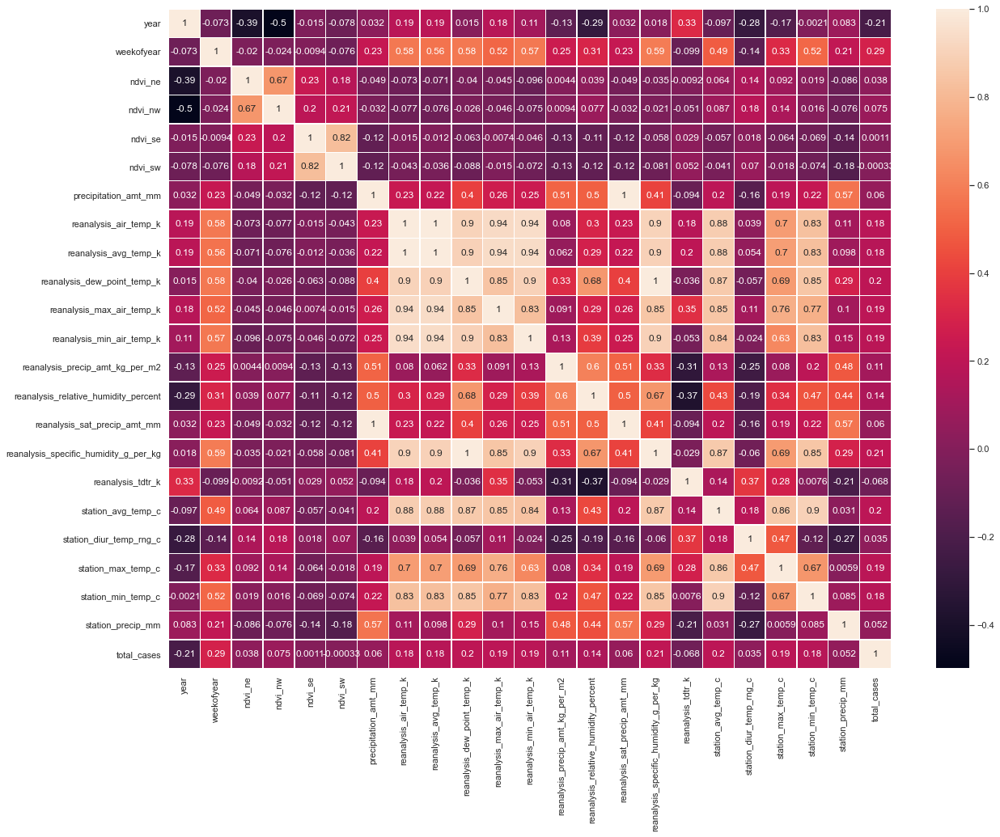

In [10]:
fig, ax = plt.subplots(figsize=(20,15))
sns.heatmap(pd.concat([df_features_sj, df_labels_sj], axis=1).corr(), annot=True, linewidths=.5, ax=ax)

<AxesSubplot:>

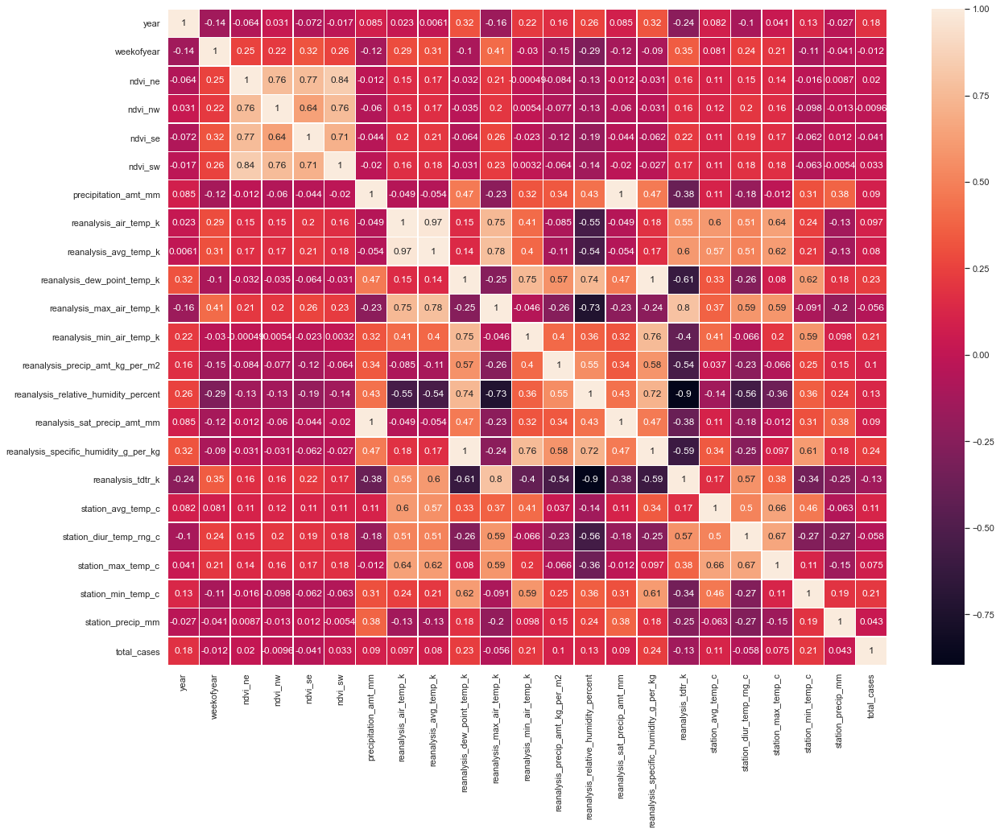

In [11]:
fig, ax = plt.subplots(figsize=(20,15))
sns.heatmap(pd.concat([df_features_iq, df_labels_iq], axis=1).corr(), annot=True, linewidths=.5, ax=ax)

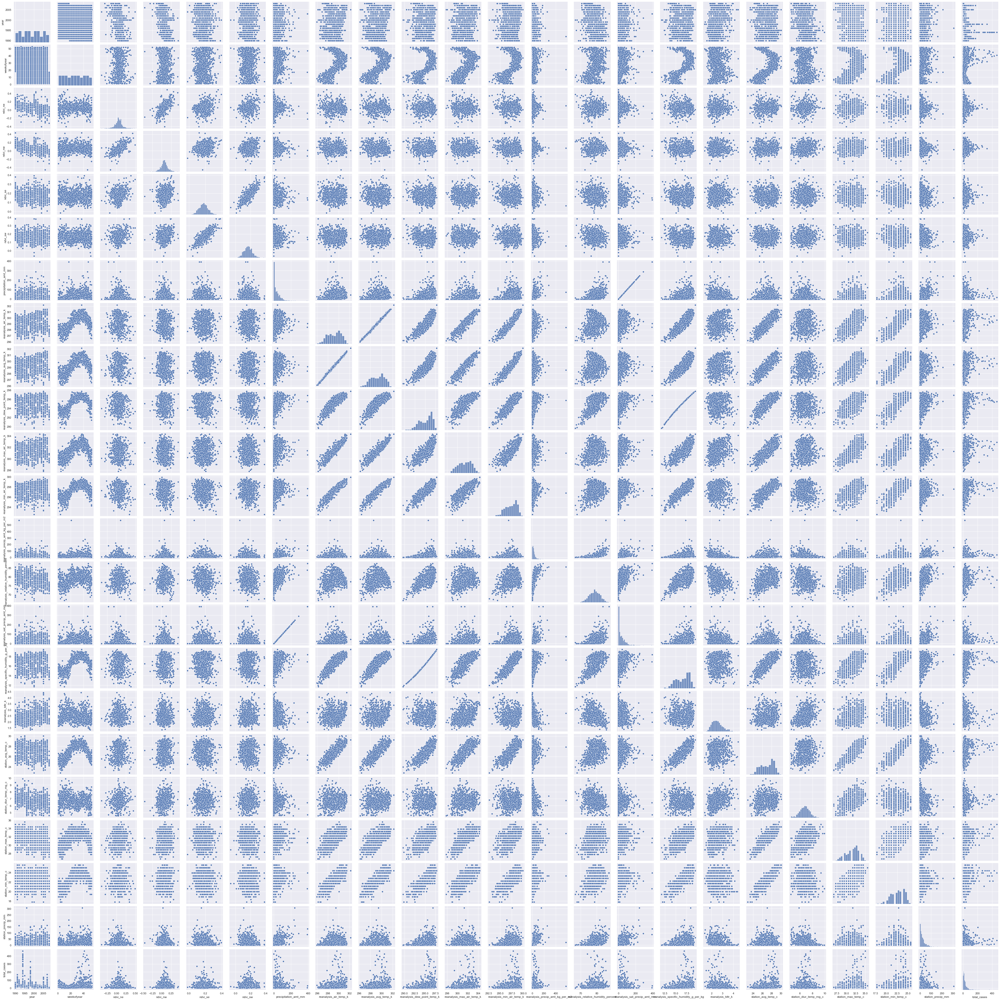

In [12]:
sns.pairplot(pd.concat([df_features_sj, df_labels_sj], axis = 1), kind='scatter')

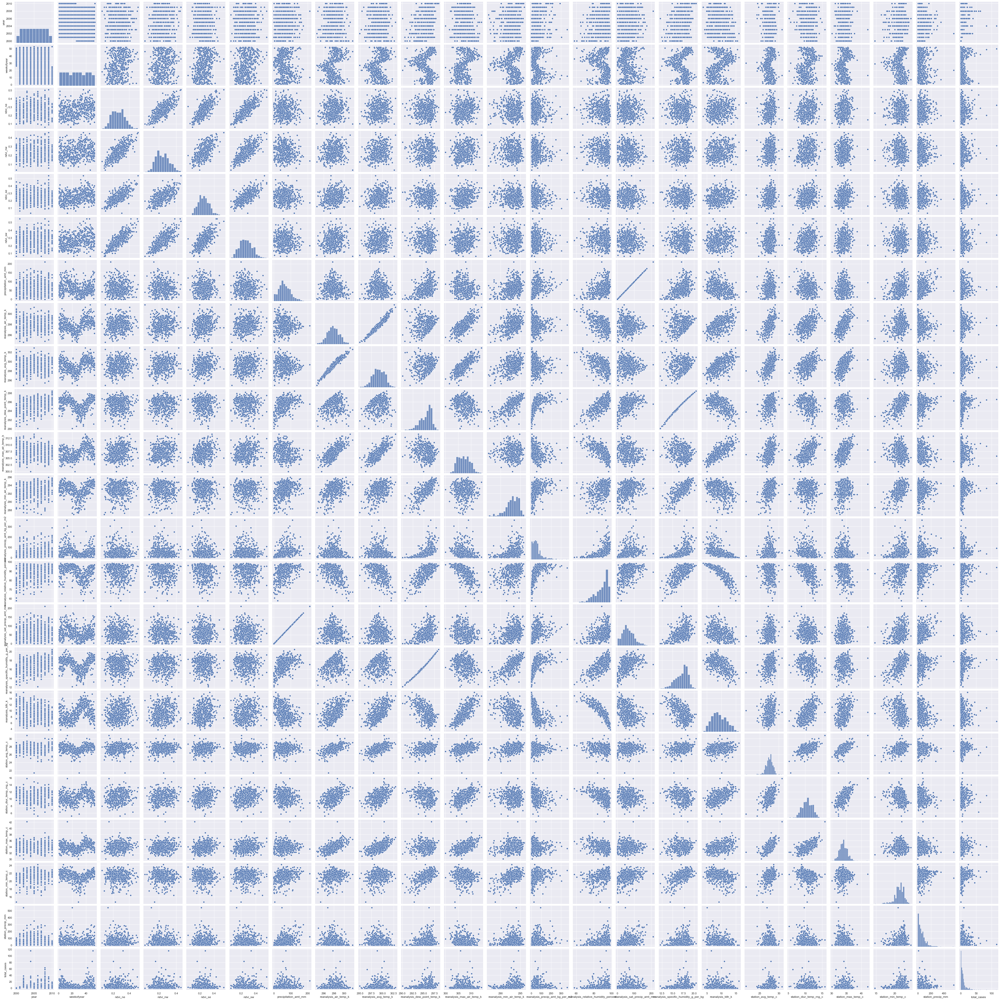

In [13]:
sns.pairplot(pd.concat([df_features_iq, df_labels_iq], axis = 1), kind='scatter')

In [14]:
sj_train = df_features_sj.copy().iloc[:-df_features_sj.shape[0] // 5]
sj_test = df_features_sj.copy().iloc[-df_features_sj.shape[0] // 5:]

iq_train = df_features_iq.copy().iloc[:-df_features_iq.shape[0] // 5]
iq_test = df_features_iq.copy().iloc[-df_features_iq.shape[0] // 5:]


sj_train.drop(columns=['week_start_date'], inplace=True)
iq_train.drop(columns=['week_start_date'], inplace=True)
sj_test.drop(columns=['week_start_date'], inplace=True)
iq_test.drop(columns=['week_start_date'], inplace=True)

In [15]:
y_train_sj = df_labels_sj.iloc[:-df_labels_sj.shape[0] // 5]
y_test_sj = df_labels_sj.iloc[-df_labels_sj.shape[0] // 5:]

y_train_iq = df_labels_iq.iloc[:-df_labels_iq.shape[0] // 5]
y_test_iq = df_labels_iq.iloc[-df_labels_iq.shape[0] // 5:]

In [16]:
sj_train_mean = sj_train.fillna(sj_train.mean(axis = 0))
iq_train_mean = iq_train.fillna(iq_train.mean(axis = 0))

sj_test_mean = sj_test.fillna(sj_test.mean(axis = 0))
iq_test_mean = iq_test.fillna(iq_test.mean(axis = 0))

In [17]:
from sklearn.preprocessing import StandardScaler

scaler_sj = StandardScaler()
scaler_iq = StandardScaler()

scaler_sj.fit(sj_train_mean.values)
scaler_iq.fit(iq_train_mean.values)

sj_train_mean_scaled = scaler_sj.transform(sj_train_mean.values)
iq_train_mean_scaled = scaler_iq.transform(iq_train_mean.values)

sj_test_mean_scaled = scaler_sj.transform(sj_test_mean.values)
iq_test_mean_scaled = scaler_iq.transform(iq_test_mean.values)

sj_train_mean_scaled = pd.DataFrame(sj_train_mean_scaled, index=sj_train_mean.index, columns=sj_train_mean.columns)
sj_test_mean_scaled = pd.DataFrame(sj_test_mean_scaled, index=sj_test_mean.index, columns=sj_test_mean.columns)

iq_train_mean_scaled = pd.DataFrame(iq_train_mean_scaled, index=iq_train_mean.index, columns=iq_train_mean.columns)
iq_test_mean_scaled = pd.DataFrame(iq_test_mean_scaled, index=iq_test_mean.index, columns=iq_test_mean.columns)


In [18]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits = 5)

In [19]:
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor


ridge = Ridge()
tree = DecisionTreeRegressor()
knn = KNeighborsRegressor()


grid_ridge = {'alpha' : np.arange(1, 1000, 1)}
grid_tree = {'max_depth' : np.arange(3, 15, 1)}
grid_knn = {'n_neighbors' : np.arange(3, 12, 1)}

grid_ridge = GridSearchCV(ridge, param_grid = grid_ridge, cv = tscv, scoring = 'neg_mean_absolute_error')
grid_tree = GridSearchCV(tree, param_grid = grid_tree, cv = tscv, scoring = 'neg_mean_absolute_error')
grid_knn = GridSearchCV(knn, param_grid = grid_knn, cv = tscv, scoring = 'neg_mean_absolute_error')



grid_ridge.fit(sj_train_mean_scaled, y_train_sj)
y_pred_ridge = grid_ridge.best_estimator_.predict(sj_test_mean_scaled)
    
grid_tree.fit(sj_train_mean_scaled, y_train_sj)
y_pred_tree = grid_tree.best_estimator_.predict(sj_test_mean_scaled)
    
grid_knn.fit(sj_train_mean_scaled, y_train_sj)
y_pred_knn = grid_knn.best_estimator_.predict(sj_test_mean_scaled)


print(grid_ridge.best_params_)
print(grid_tree.best_params_)
print(grid_knn.best_params_)

{'alpha': 999}
{'max_depth': 5}
{'n_neighbors': 10}


In [20]:
from sklearn.metrics import mean_absolute_error as mae

19.15186083646048


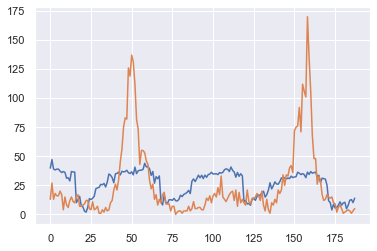

In [21]:
print(mae(y_test_sj, y_pred_ridge))
plt.plot(y_pred_ridge)
plt.plot(y_test_sj.values)

19.508510638297874


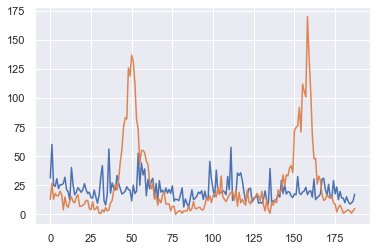

In [22]:
print(mae(y_test_sj, y_pred_knn))
plt.plot(y_pred_knn)
plt.plot(y_test_sj.values)

18.487657540627602


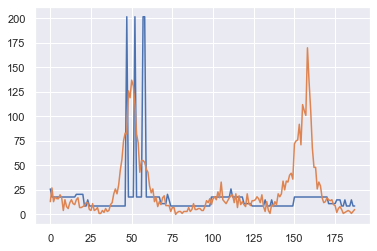

In [23]:
print(mae(y_test_sj, y_pred_tree))
plt.plot(y_pred_tree)
plt.plot(y_test_sj.values)